# Catalonia Municipal Waste Study
## Data Visualization

### Description

The following set of notebooks it's collected the study on the dataset of Catalonia Municipal Waste published by the Generalitat de Catalunya through the portal of open data. The intention is to research and dig into this data to find interesting conclusions and possible applications.

In this specific notebook, it's done a visualization of the data contained in the dataset once this has already been enriched with geographic data.

### Running the code

For running the code it's just required to press the play all cells button. (Or run it one by one)

**Disclaimer**: Be careful with the last two cells, they consume memory and plot a lot of figures so may be a bit of time waiting.

## Tools Used

For this notebook the main framework used for cleaning the data and processing it was Spark.

For plotting and doing visualizations of the data it has been used Matplotlib. Also, Geopandas for plotting the figures with the map of Catalonia.

### Authors
Marc Felip Pomes, Joaquim Picó Mora

In [1]:
import pandas as pd
from pyspark.sql import SparkSession
import pyspark.sql.functions as f
from scipy.stats import linregress
import matplotlib.pyplot as plt
import geopandas
from pyspark.sql.types import StructType,StructField, StringType, IntegerType,FloatType
import math
from shapely import wkt
from scipy import stats
import numpy as np
import os

/home/quim/.local/lib/python3.10/site-packages/geopandas/_compat.py:111: UserWarning: The Shapely GEOS version (3.10.2-CAPI-1.16.0) is incompatible with the GEOS version PyGEOS was compiled with (3.10.1-CAPI-1.16.0). Conversions between both will be slow.
  warnings.warn(


Let's start by initializing spark and starting to take a look on how the data is imported from the csv

In [2]:
spark = (SparkSession
 .builder
 .appName("WasteVisualization")
 .getOrCreate())
spark.conf.set("spark.sql.repl.eagerEval.enabled", True)

Using Spark's default log4j profile: org/apache/spark/log4j-defaults.properties
Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
22/06/02 10:40:57 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
comarques = geopandas.read_file("./datasets/comarques-catalunya.geojson")
comarques = comarques.dissolve(by='comarca').drop(columns=["cap_comar"])
waste_file = "./datasets/enriched/residus_municipi_geo.csv"

# Data cleaning

In [4]:
df_municipis = spark.read.csv(waste_file, header = True)
df_municipis.printSchema()

root
 |-- _c0: string (nullable = true)
 |-- Longitud: string (nullable = true)
 |-- Latitud: string (nullable = true)
 |-- geometry: string (nullable = true)
 |-- Any: string (nullable = true)
 |-- Codi municipi: string (nullable = true)
 |-- Municipi: string (nullable = true)
 |-- Comarca: string (nullable = true)
 |-- Població: string (nullable = true)
 |-- Autocompostatge: string (nullable = true)
 |-- Matèria orgànica: string (nullable = true)
 |-- Poda i jardineria: string (nullable = true)
 |-- Paper i cartró: string (nullable = true)
 |-- Vidre: string (nullable = true)
 |-- Envasos lleugers: string (nullable = true)
 |-- Residus voluminosos + fusta: string (nullable = true)
 |-- RAEE: string (nullable = true)
 |-- Ferralla: string (nullable = true)
 |-- Olis vegetals: string (nullable = true)
 |-- Tèxtil: string (nullable = true)
 |-- Runes: string (nullable = true)
 |-- Residus Especials en petites quantitats (REPQ: string (nullable = true)
 |-- Piles: string (nullable = true

It seems that the spark engine is not able to infer the different types that our dataset must-have. For this reason, in the following cells, a schema is created and applied for reading the file to make sure all data has the desired type.

In [5]:
schema = StructType([ 
    StructField("_c0",IntegerType(),True), 
    StructField("Longitud",FloatType(),True), 
    StructField("Latitud",FloatType(),True), 
    StructField("geometry", StringType(), True), 
    StructField("Any", IntegerType(), True), 
    StructField("Codi municipi", StringType(), True), 
    StructField("Municipi", StringType(), True), 
    StructField("Comarca", StringType(), True), 
    StructField("Població", StringType(), True), 
    StructField("Autocompostatge",FloatType(),True), 
    StructField("Matèria orgànica",FloatType(),True), 
    StructField("Poda i jardineria",FloatType(),True), 
    StructField("Paper i cartró",FloatType(),True), 
    StructField("Vidre",FloatType(),True), 
    StructField("Envasos lleugers",FloatType(),True), 
    StructField("Residus voluminosos + fusta",FloatType(),True), 
    StructField("RAEE",FloatType(),True), 
    StructField("Ferralla",FloatType(),True), 
    StructField("Olis vegetals",FloatType(),True), 
    StructField("Tèxtil",FloatType(),True), 
    StructField("Runes",FloatType(),True), 
    StructField("Residus Especials en petites quantitats (REPQ",FloatType(),True), 
    StructField("Piles",FloatType(),True), 
    StructField("Medicaments",FloatType(),True), 
    StructField("Altres recollides selectives",FloatType(),True), 
    StructField("Total Recollida Selectiva",FloatType(),True), 
    StructField("R.S. / R.M. % total",FloatType(),True), 
    StructField("Kg/hab/any recollida selectiva",FloatType(),True), 
    StructField("Resta a Dipòsit",FloatType(),True), 
    StructField("Resta a Incineració",FloatType(),True), 
    StructField("Resta a Tractament Mecànic Biològic",FloatType(),True), 
    StructField("Resta (sense desglossar)",FloatType(),True), 
    StructField("Suma Fracció Resta",FloatType(),True), 
    StructField("F.R. / R.M. %",FloatType(),True),
    StructField("Generació Residus Municipal Totals",FloatType(),True),
    StructField("Kg / hab / dia",FloatType(),True),
    StructField("Kg / hab / any",FloatType(),True)
  ])


We can see now how by applying the schema we had been able to get each field with its pertinent type

In [6]:
df_municipis = spark.read.schema(schema).csv(waste_file, header=True)
df_municipis.printSchema()

root
 |-- _c0: integer (nullable = true)
 |-- Longitud: float (nullable = true)
 |-- Latitud: float (nullable = true)
 |-- geometry: string (nullable = true)
 |-- Any: integer (nullable = true)
 |-- Codi municipi: string (nullable = true)
 |-- Municipi: string (nullable = true)
 |-- Comarca: string (nullable = true)
 |-- Població: string (nullable = true)
 |-- Autocompostatge: float (nullable = true)
 |-- Matèria orgànica: float (nullable = true)
 |-- Poda i jardineria: float (nullable = true)
 |-- Paper i cartró: float (nullable = true)
 |-- Vidre: float (nullable = true)
 |-- Envasos lleugers: float (nullable = true)
 |-- Residus voluminosos + fusta: float (nullable = true)
 |-- RAEE: float (nullable = true)
 |-- Ferralla: float (nullable = true)
 |-- Olis vegetals: float (nullable = true)
 |-- Tèxtil: float (nullable = true)
 |-- Runes: float (nullable = true)
 |-- Residus Especials en petites quantitats (REPQ: float (nullable = true)
 |-- Piles: float (nullable = true)
 |-- Medicam

By taking a first look at the data, it has been detected that the "Poblacio" field is giving us some trouble because it has a "." for separating between hundreds and thousands so let's parse it as a string and change "." for "" applying a transformation to the column. After this, the column will be parsed to integer again.

In [8]:
df_municipis.select("*").where(f.col("Municipi") == "Juneda").show(1,vertical=True)

-RECORD 0-------------------------------------------------------------
 _c0                                           | 7346                 
 Longitud                                      | 0.8251993            
 Latitud                                       | 41.548706            
 geometry                                      | POINT (0.82519931... 
 Any                                           | 2000                 
 Codi municipi                                 | 251193.0             
 Municipi                                      | Juneda               
 Comarca                                       | Garrigues            
 Població                                      | 2.996                
 Autocompostatge                               | null                 
 Matèria orgànica                              | 0.0                  
 Poda i jardineria                             | 0.05                 
 Paper i cartró                                | 40.79                
 Vidre

22/06/02 10:41:03 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especials en petites quantitats (REPQ, Piles, Medicaments, Altres recollides selectives, Total Recollida Selectiva, R.S. / R.M. % total, Kg/hab/any recollida selectiva, Resta a Dipòsit, Resta a Incineració, Resta a Tractament Mecànic Biològic, Resta (sense desglossar), Suma Fracció Resta, F.R. / R.M. %, Generació Residus Municipal Totals, Kg / hab / dia, Kg / hab / any
 Schema: _c0, Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especia

For doing so, a UDF function has been created

In [9]:
remove_dots_and_cast = f.udf(lambda x : x.replace(".", ""))
df_municipis = df_municipis.withColumn("Població", remove_dots_and_cast(f.col("Població")))
df_municipis = df_municipis.withColumn("Població", df_municipis["Població"].cast(IntegerType()))

In [10]:
df_municipis.select("*").where(f.col("Municipi") == "Juneda").show(1,vertical=True)

-RECORD 0-------------------------------------------------------------
 _c0                                           | 7346                 
 Longitud                                      | 0.8251993            
 Latitud                                       | 41.548706            
 geometry                                      | POINT (0.82519931... 
 Any                                           | 2000                 
 Codi municipi                                 | 251193.0             
 Municipi                                      | Juneda               
 Comarca                                       | Garrigues            
 Població                                      | 2996                 
 Autocompostatge                               | null                 
 Matèria orgànica                              | 0.0                  
 Poda i jardineria                             | 0.05                 
 Paper i cartró                                | 40.79                
 Vidre

22/06/02 10:41:04 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especials en petites quantitats (REPQ, Piles, Medicaments, Altres recollides selectives, Total Recollida Selectiva, R.S. / R.M. % total, Kg/hab/any recollida selectiva, Resta a Dipòsit, Resta a Incineració, Resta a Tractament Mecànic Biològic, Resta (sense desglossar), Suma Fracció Resta, F.R. / R.M. %, Generació Residus Municipal Totals, Kg / hab / dia, Kg / hab / any
 Schema: _c0, Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especia

By looking at the max population number, we can see that is an impossible number as Catalunya has around 7.500.000 citizens at the date of today

In [11]:
df_municipis.summary()

22/06/02 10:41:05 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especials en petites quantitats (REPQ, Piles, Medicaments, Altres recollides selectives, Total Recollida Selectiva, R.S. / R.M. % total, Kg/hab/any recollida selectiva, Resta a Dipòsit, Resta a Incineració, Resta a Tractament Mecànic Biològic, Resta (sense desglossar), Suma Fracció Resta, F.R. / R.M. %, Generació Residus Municipal Totals, Kg / hab / dia, Kg / hab / any
 Schema: _c0, Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especia

summary,_c0,Longitud,Latitud,geometry,Any,Codi municipi,Municipi,Comarca,Població,Autocompostatge,Matèria orgànica,Poda i jardineria,Paper i cartró,Vidre,Envasos lleugers,Residus voluminosos + fusta,RAEE,Ferralla,Olis vegetals,Tèxtil,Runes,Residus Especials en petites quantitats (REPQ,Piles,Medicaments,Altres recollides selectives,Total Recollida Selectiva,R.S. / R.M. % total,Kg/hab/any recollida selectiva,Resta a Dipòsit,Resta a Incineració,Resta a Tractament Mecànic Biològic,Resta (sense desglossar),Suma Fracció Resta,F.R. / R.M. %,Generació Residus Municipal Totals,Kg / hab / dia,Kg / hab / any
count,18846,18846,18846,18846,18846,18846,18846,18846,18846,7542,18846,18846,18846,18846,18846,18846,9426,7542,7542,16962,8484,8484,18846,18846,18846,18846,18846,18846,15078,15078,15078,3768,18846,18846,18846,18846,18846
mean,9422.5,1.7496833581586912,41.735788322059285,null,2009.5022285896212,211798.45250981642,null,null,24195.52610633556,53.56642800318218,300.3475958867291,81.12913848222951,215.68673540860627,138.2755416628864,95.28503411584076,175.58867688494573,2685.885635476342,750.1617608061522,108.14691063378415,660.3448296191486,10390.008486562941,220.48385195662422,52.102302875941845,56.36750504085747,8362.930913721744,1192.7354931027662,30.25851375144884,161.67141569302422,97053.67661493567,33991.35674492638,78548.66348322059,170417.73487261147,2357.9203645729986,69.73618009579728,3938.540789194102,1.5279847178914567,556.9933277349513
stddev,5440.515922226494,0.7871043761058591,0.4208746575474897,null,5.766949162934999,125124.55998437676,null,null,519161.27198012377,153.17549767633474,3050.487022678066,427.5867946644317,2045.4861556247447,1012.9107037502852,605.1514519108807,1243.1767385534004,18173.304620951923,2356.1515489364706,648.7590503621035,5976.136836946031,36927.65352504999,740.8188342523684,368.3525927992337,515.3350724672584,41817.65767669423,8613.759534088422,18.47783042028848,115.38615561505051,583300.1781852151,446108.458740293,1020738.1447998831,1209494.527133123,17522.625216198405,18.483498128417484,27716.925850474192,0.653604974743945,238.05703455301756
min,0,0.25057194,40.542862,POINT (0.25057195...,2000,170010.0,Abella de la Conca,Alt Camp,10,0.0,0.0,0.0,0.0,0.0,-0.14,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,4710,1.064357,41.43007,null,2004,82397.0,null,null,1754,0.0,0.0,0.0,7.65,8.61,3.63,0.15,36.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,33.11,15.48,80.38,2014.0,0.0,0.0,6193.0,92.97,58.68,158.14,1.15,418.4
50%,9420,1.7361847,41.710415,null,2010,171766.0,null,null,3278,0.0,9.14,0.0,22.25,22.55,11.88,7.33,189.0,27.0,3.0,0.0,113.0,9.0,2.0,5.0,17.0,109.83,27.48,139.15,11269.0,0.0,0.0,22128.0,266.0,72.49,446.7,1.37,498.07
75%,14132,2.3441372,42.06616,null,2015,252075.0,null,null,6560,48.0,117.44,16.26,95.32,78.14,49.82,54.64,1142.0,364.0,41.0,48.0,3367.0,116.0,16.0,22.0,628.0,531.91,41.31,215.29,43727.0,0.0,0.0,79094.0,1018.05,84.51,1857.43,1.69,616.33
max,18845,3.275849,42.838367,POINT (3.27584915...,2019,89058.0,Òrrius,Vallès Oriental,16367620,2764.0,128393.62,13457.29,97801.8,39139.9,25792.81,51485.3,752192.0,54487.0,23654.0,304282.0,774636.0,22512.0,15071.0,27069.0,1416622.0,327502.88,100.0,2187.45,3.4422736E7,2.2374082E7,4.506766E7,6.667544E7,688440.44,100.0,902356.2,8.72,3183.92


In [12]:
df_municipis.select("*").where(f.col("Població") > 10000000)

22/06/02 10:41:09 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especials en petites quantitats (REPQ, Piles, Medicaments, Altres recollides selectives, Total Recollida Selectiva, R.S. / R.M. % total, Kg/hab/any recollida selectiva, Resta a Dipòsit, Resta a Incineració, Resta a Tractament Mecànic Biològic, Resta (sense desglossar), Suma Fracció Resta, F.R. / R.M. %, Generació Residus Municipal Totals, Kg / hab / dia, Kg / hab / any
 Schema: _c0, Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especia

_c0,Longitud,Latitud,geometry,Any,Codi municipi,Municipi,Comarca,Població,Autocompostatge,Matèria orgànica,Poda i jardineria,Paper i cartró,Vidre,Envasos lleugers,Residus voluminosos + fusta,RAEE,Ferralla,Olis vegetals,Tèxtil,Runes,Residus Especials en petites quantitats (REPQ,Piles,Medicaments,Altres recollides selectives,Total Recollida Selectiva,R.S. / R.M. % total,Kg/hab/any recollida selectiva,Resta a Dipòsit,Resta a Incineració,Resta a Tractament Mecànic Biològic,Resta (sense desglossar),Suma Fracció Resta,F.R. / R.M. %,Generació Residus Municipal Totals,Kg / hab / dia,Kg / hab / any
1800,2.177241,41.382404,POINT (2.17724110...,2000,80193.0,Barcelona,Barcelonès,15088050,null,2925.1,10269.25,23281.99,15141.69,6.382,36647.21,null,null,null,null,null,null,8913.0,7122.0,429767.0,99105.26,13.15,65.68,null,null,null,654786.0,654.786,86.85,753891.25,1.37,499.66
1801,2.177241,41.382404,POINT (2.17724110...,2001,80193.0,Barcelona,Barcelonès,15088050,null,888.0,8793.13,27833.46,16773.79,8092.73,27716.67,null,null,null,null,null,null,1206.0,4963.0,692903.0,97197.04,13.02,64.42,null,null,null,649234.0,649.234,86.98,746431.06,1.36,494.72
1802,2.177241,41.382404,POINT (2.17724110...,2002,80193.0,Barcelona,Barcelonès,15038840,null,27232.03,9926.96,28100.54,18004.94,9444.77,30479.26,null,null,null,3283.0,null,null,9151.0,6441.0,697026.0,130347.51,16.35,86.67,null,null,null,6.667544E7,666754.4,83.65,797101.9,1.45,530.03
1803,2.177241,41.382404,POINT (2.17724110...,2003,80193.0,Barcelona,Barcelonès,15827380,null,59356.55,13376.2,32124.45,20153.47,10644.02,35790.58,null,null,null,332.0,null,null,9609.0,9023.0,63517.0,178016.5,20.5,112.47,null,null,null,690308.0,690.308,79.5,868324.5,1.5,548.62
1804,2.177241,41.382404,POINT (2.17724110...,2004,80193.0,Barcelona,Barcelonès,15785460,null,71799.16,9665.85,42158.74,21906.08,11.696,37168.2,null,null,null,148892.0,null,null,9243.0,10039.0,735806.0,203433.83,22.81,128.87,3641716.0,2.2374082E7,100528.0,null,688440.44,77.19,891874.25,1.55,565.0
1805,2.177241,41.382404,POINT (2.17724110...,2005,80193.0,Barcelona,Barcelonès,15930750,null,68609.31,13457.29,79257.19,23859.4,12661.24,39263.82,null,null,null,166513.0,null,null,9723.0,12524.0,69821.0,245977.95,28.11,154.4,3.4422736E7,2.0726602E7,7749893.0,null,628992.3,71.89,874970.25,1.5,549.23
1806,2.177241,41.382404,POINT (2.17724110...,2006,80193.0,Barcelona,Barcelonès,16056020,null,70.912,10084.74,59404.28,25969.77,14085.73,36663.57,null,null,null,12558.0,null,null,1089.0,12327.0,99692.0,228577.27,26.68,142.36,4092942.0,1.7095004E7,4785968.0,null,628103.94,73.32,856681.2,1.46,533.56
1807,2.177241,41.382404,POINT (2.17724110...,2007,80193.0,Barcelona,Barcelonès,15951100,null,84050.37,8815.46,94799.21,29943.2,17051.38,35823.47,null,null,null,151581.0,null,null,12664.0,13936.0,1320391.0,285468.8,31.64,178.96,2.9736672E7,1.6704532E7,1.5247535E7,null,616887.4,68.36,902356.2,1.55,565.7
1808,2.177241,41.382404,POINT (2.17724110...,2008,80193.0,Barcelona,Barcelonès,16159080,null,84013.62,10074.73,97801.8,31954.18,18493.2,21801.1,null,null,null,304282.0,null,null,1233.0,15616.0,1316434.0,280625.25,31.36,173.66,2.7397868E7,1.5496191E7,1.8526172E7,null,614202.3,68.64,894827.56,1.52,553.76
1809,2.177241,41.382404,POINT (2.17724110...,2009,80193.0,Barcelona,Barcelonès,16215370,null,79519.59,10471.85,87578.16,31674.19,18748.53,51485.3,null,null,null,167893.0,null,null,12008.0,17541.0,1416622.0,295618.25,34.29,182.31,1.8162056E7,2162831.0,1.6850176E7,null,566405.44,65.71,862023.7,1.46,531.61


Seems that the dataset contains an extra zero for the city of Barcelona so this last zero has to be removed

In [13]:
divide = f.udf(lambda x : x if x < 10000000 else x/10)
df_municipis = df_municipis.withColumn("Població", divide(f.col("Població")))

In [14]:
df_municipis.select("*").where(f.col("Municipi") == "Barcelona")

22/06/02 10:41:10 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especials en petites quantitats (REPQ, Piles, Medicaments, Altres recollides selectives, Total Recollida Selectiva, R.S. / R.M. % total, Kg/hab/any recollida selectiva, Resta a Dipòsit, Resta a Incineració, Resta a Tractament Mecànic Biològic, Resta (sense desglossar), Suma Fracció Resta, F.R. / R.M. %, Generació Residus Municipal Totals, Kg / hab / dia, Kg / hab / any
 Schema: _c0, Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especia

_c0,Longitud,Latitud,geometry,Any,Codi municipi,Municipi,Comarca,Població,Autocompostatge,Matèria orgànica,Poda i jardineria,Paper i cartró,Vidre,Envasos lleugers,Residus voluminosos + fusta,RAEE,Ferralla,Olis vegetals,Tèxtil,Runes,Residus Especials en petites quantitats (REPQ,Piles,Medicaments,Altres recollides selectives,Total Recollida Selectiva,R.S. / R.M. % total,Kg/hab/any recollida selectiva,Resta a Dipòsit,Resta a Incineració,Resta a Tractament Mecànic Biològic,Resta (sense desglossar),Suma Fracció Resta,F.R. / R.M. %,Generació Residus Municipal Totals,Kg / hab / dia,Kg / hab / any
1800,2.177241,41.382404,POINT (2.17724110...,2000,80193.0,Barcelona,Barcelonès,1508805.0,null,2925.1,10269.25,23281.99,15141.69,6.382,36647.21,null,null,null,null,null,null,8913.0,7122.0,429767.0,99105.26,13.15,65.68,null,null,null,654786.0,654.786,86.85,753891.25,1.37,499.66
1801,2.177241,41.382404,POINT (2.17724110...,2001,80193.0,Barcelona,Barcelonès,1508805.0,null,888.0,8793.13,27833.46,16773.79,8092.73,27716.67,null,null,null,null,null,null,1206.0,4963.0,692903.0,97197.04,13.02,64.42,null,null,null,649234.0,649.234,86.98,746431.06,1.36,494.72
1802,2.177241,41.382404,POINT (2.17724110...,2002,80193.0,Barcelona,Barcelonès,1503884.0,null,27232.03,9926.96,28100.54,18004.94,9444.77,30479.26,null,null,null,3283.0,null,null,9151.0,6441.0,697026.0,130347.51,16.35,86.67,null,null,null,6.667544E7,666754.4,83.65,797101.9,1.45,530.03
1803,2.177241,41.382404,POINT (2.17724110...,2003,80193.0,Barcelona,Barcelonès,1582738.0,null,59356.55,13376.2,32124.45,20153.47,10644.02,35790.58,null,null,null,332.0,null,null,9609.0,9023.0,63517.0,178016.5,20.5,112.47,null,null,null,690308.0,690.308,79.5,868324.5,1.5,548.62
1804,2.177241,41.382404,POINT (2.17724110...,2004,80193.0,Barcelona,Barcelonès,1578546.0,null,71799.16,9665.85,42158.74,21906.08,11.696,37168.2,null,null,null,148892.0,null,null,9243.0,10039.0,735806.0,203433.83,22.81,128.87,3641716.0,2.2374082E7,100528.0,null,688440.44,77.19,891874.25,1.55,565.0
1805,2.177241,41.382404,POINT (2.17724110...,2005,80193.0,Barcelona,Barcelonès,1593075.0,null,68609.31,13457.29,79257.19,23859.4,12661.24,39263.82,null,null,null,166513.0,null,null,9723.0,12524.0,69821.0,245977.95,28.11,154.4,3.4422736E7,2.0726602E7,7749893.0,null,628992.3,71.89,874970.25,1.5,549.23
1806,2.177241,41.382404,POINT (2.17724110...,2006,80193.0,Barcelona,Barcelonès,1605602.0,null,70.912,10084.74,59404.28,25969.77,14085.73,36663.57,null,null,null,12558.0,null,null,1089.0,12327.0,99692.0,228577.27,26.68,142.36,4092942.0,1.7095004E7,4785968.0,null,628103.94,73.32,856681.2,1.46,533.56
1807,2.177241,41.382404,POINT (2.17724110...,2007,80193.0,Barcelona,Barcelonès,1595110.0,null,84050.37,8815.46,94799.21,29943.2,17051.38,35823.47,null,null,null,151581.0,null,null,12664.0,13936.0,1320391.0,285468.8,31.64,178.96,2.9736672E7,1.6704532E7,1.5247535E7,null,616887.4,68.36,902356.2,1.55,565.7
1808,2.177241,41.382404,POINT (2.17724110...,2008,80193.0,Barcelona,Barcelonès,1615908.0,null,84013.62,10074.73,97801.8,31954.18,18493.2,21801.1,null,null,null,304282.0,null,null,1233.0,15616.0,1316434.0,280625.25,31.36,173.66,2.7397868E7,1.5496191E7,1.8526172E7,null,614202.3,68.64,894827.56,1.52,553.76
1809,2.177241,41.382404,POINT (2.17724110...,2009,80193.0,Barcelona,Barcelonès,1621537.0,null,79519.59,10471.85,87578.16,31674.19,18748.53,51485.3,null,null,null,167893.0,null,null,12008.0,17541.0,1416622.0,295618.25,34.29,182.31,1.8162056E7,2162831.0,1.6850176E7,null,566405.44,65.71,862023.7,1.46,531.61


# Visualitzation of the Catalunya waste managing through the years

Firstly it has been decided to do an aggregation of all the different waste values of the dataset by year to check how Catalonia in general is managing the waste generated by its inhabitants. This will give us a global vision and will help us to get some conclusions on what is the trend.

In [15]:
def col_to_list(df,col):
    return df.select(col).rdd.map(lambda x : x[col]).collect()

In the first instance, the fields that we are not interested to use in this visualization are removed from the dataset. Those are the ones containing geographic data, keys, and some fields that contain aggregations of data. As we are going to aggregate through summing the values, the ones that have a different aggrupation must be treated apart.

In [16]:
cat_tendency  = df_municipis.drop('_c0', 'Latitud', 'Longitud','geometry','Codi municipi', 'Municipi', 'Comarca', 'F.R. / R.M. %', 'R.S. / R.M. % total', 'Kg / hab / dia', 'Kg / hab / dia', 'Kg/hab/any recollida selectiva', 'Kg / hab / any')

The data is grouped by years to do the graphics in base of time

In [17]:
sumcols = { x : "sum" for x in cat_tendency.columns}
cat_tendency = cat_tendency.groupBy("Any").agg(sumcols)

In [18]:
cat_tendency.show(1,vertical=True)

-RECORD 0----------------------------------------------------------------
 Any                                                | 2003               
 sum(Poda i jardineria)                             | 41877.758048761636 
 sum(Generació Residus Municipal Totals)            | 3706184.2556524277 
 sum(Altres recollides selectives)                  | 1.0207063E7        
 sum(RAEE)                                          | null               
 sum(Resta a Tractament Mecànic Biològic)           | null               
 sum(Piles)                                         | 47277.0            
 sum(Envasos lleugers)                              | 49089.13966534287  
 sum(Resta (sense desglossar))                      | 1.46291398E8       
 sum(Paper i cartró)                                | 145024.28943732195 
 sum(Resta a Dipòsit)                               | null               
 sum(Medicaments)                                   | 31462.0            
 sum(Autocompostatge)                 

In [19]:
cat_tendency = cat_tendency.sort('Any')
cat_tendency

Any,sum(Poda i jardineria),sum(Generació Residus Municipal Totals),sum(Altres recollides selectives),sum(RAEE),sum(Resta a Tractament Mecànic Biològic),sum(Piles),sum(Envasos lleugers),sum(Resta (sense desglossar)),sum(Paper i cartró),sum(Resta a Dipòsit),sum(Medicaments),sum(Autocompostatge),sum(Tèxtil),sum(Ferralla),sum(Total Recollida Selectiva),sum(Runes),sum(Resta a Incineració),sum(Suma Fracció Resta),sum(Olis vegetals),sum(Residus voluminosos + fusta),sum(Població),sum(Vidre),sum(Matèria orgànica),sum(Any),sum(Residus Especials en petites quantitats (REPQ)
2000,22394.422997104004,3374224.7179949284,5859488.0,null,null,41908.0,13934.321968451142,1.41765808E8,100878.52690210566,null,27210.0,null,null,null,422693.7450612597,null,null,1612313.5590019226,null,104224.95108978637,7321934.0,70287.05061583966,23663.547087430954,1884000,null
2001,24922.02181897126,3407862.44553566,7482435.0,null,null,31454.0,30212.129956262186,1.21305384E8,109810.84691004641,null,25487.0,null,null,null,466538.45095921867,null,null,1500686.005606532,null,90473.73202686384,7321934.0,76825.49899237975,34758.41893672943,1884942,null
2002,32188.379747008905,3439516.35524714,7161124.0,null,null,42618.0,36251.741477681324,2.32771435E8,115543.15626640804,null,29562.0,null,59913.0,null,547814.2762013115,null,null,2560439.82433331,null,99469.92398158461,7838861.0,80615.45857802965,92382.62149500847,1885884,null
2003,41877.758048761636,3706184.2556524277,1.0207063E7,null,null,47277.0,49089.13966534287,1.46291398E8,145024.28943732195,null,31462.0,null,311469.0,null,709890.213885786,null,null,1543843.0336395502,null,87784.37295450456,7972404.0,92830.53084648587,149388.15095323324,1886826,null
2004,47926.23937965557,3889402.6505765915,1.2851195E7,null,1.0001674E7,45586.0,39928.83607452363,null,176803.2783266995,1.15881102E8,34868.0,null,427273.0,null,830907.6029026713,null,6.5525735E7,2837424.520424843,null,112114.70073706098,8421211.0,101932.49003232457,174447.0359313786,1887768,null
2005,57559.66500233859,3923293.1977746487,1.3443325E7,null,1.6239162E7,47063.0,62413.14014937729,null,232314.49669003487,1.64150817E8,42257.0,null,472846.0,null,986095.3520085812,null,4.7768903E7,2557507.842664838,null,140080.1203895621,8326911.0,109917.25026023202,214008.93267711997,1888710,null
2006,66037.65053538978,3977030.899320483,1.4583361E7,null,1.281243E7,36874.0,73609.81062313914,null,240965.502263844,1.42239339E8,44746.0,null,420224.0,null,1084977.4837565422,null,5.5285718E7,2687189.5387710333,null,160925.72003244422,8156285.0,122573.1142180264,159011.22689697891,1889652,null
2007,64888.05016325228,4057578.8389137983,1.7289069E7,null,3.5391231E7,57077.0,85812.28100336343,null,289513.41585084796,1.52580575E8,46526.0,null,481874.0,null,1226894.107268393,null,4.6303474E7,2684636.8816764355,null,168484.82853875495,8657233.0,138462.12939067185,292781.9009194672,1890594,null
2008,84402.93841552734,4041876.0775921345,1.828604E7,null,4.1235358E7,45302.0,99286.65923994035,null,294975.97771552205,1.52899061E8,57625.0,null,778290.0,null,1268633.4421904087,null,4.4478049E7,2594051.0886437893,null,131105.23990370333,8483355.0,146510.74982959405,311865.92139035463,1891536,null
2009,96983.45980308205,3942800.079837203,1.5252845E7,null,3.1775726E7,51727.0,106728.40216162801,null,274612.73693826795,1.39523514E8,64988.0,null,774164.0,null,1343558.638818264,null,3.0615295E7,2477394.3529868126,null,205539.55158288404,8707959.0,149333.11950715818,336924.6763367653,1892478,null


The information regarding each waste is plotted in different line plots

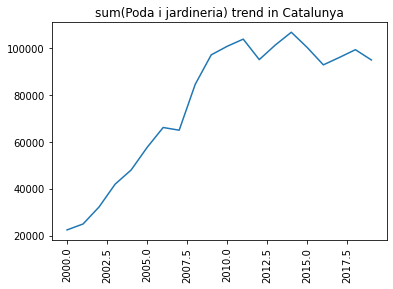

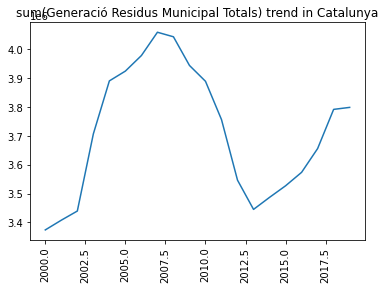

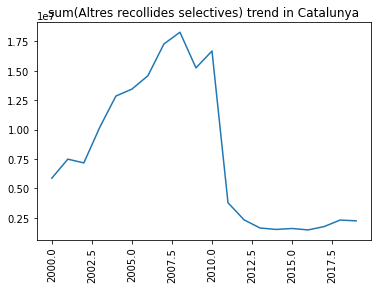

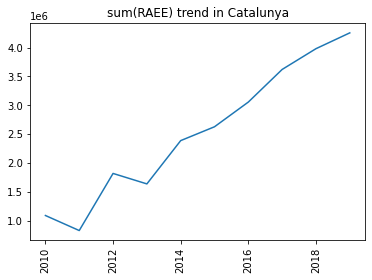

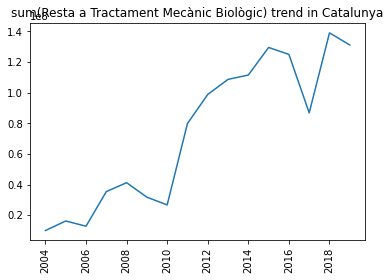

...

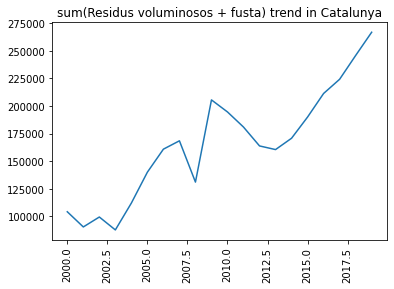

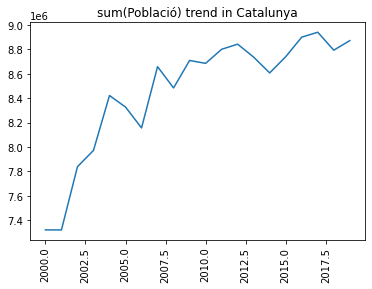

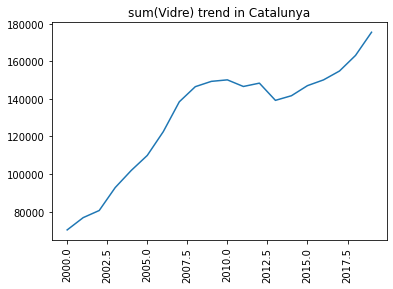

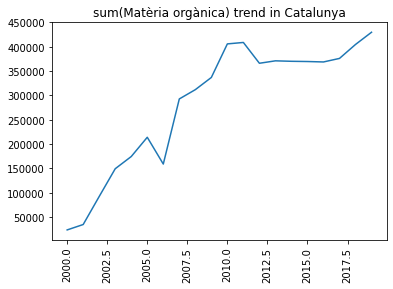

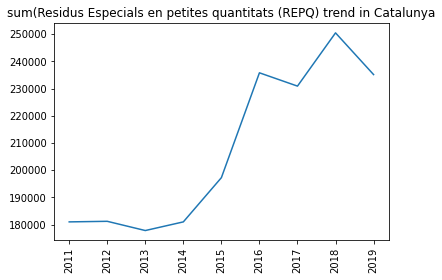

In [45]:
def lineplot_waste_by_year(df, region): 
    for col in df.columns:
        if col != 'sum(Any)' and col != 'Any' and col != 'avg(Any)':
            fig, ax = plt.subplots()
            ax.plot(col_to_list(df, "Any"), col_to_list(df, col))
            plt.xticks(rotation=90)
            ax.set_title(col + " trend in "+region)
            plt.show()
lineplot_waste_by_year(cat_tendency, "Catalunya")

As it has been said before, the data that requires a different agrupation was placed asside and is treated anbd ploted now separetly

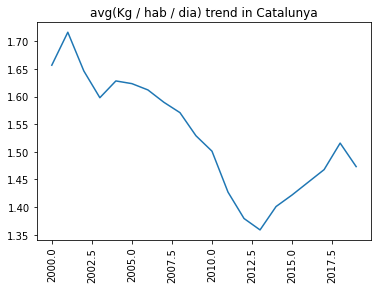

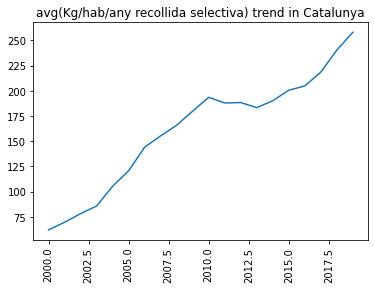

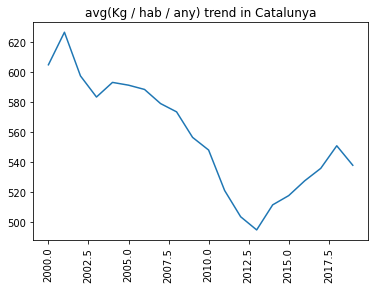

In [46]:
cat_tendency_agrupations = df_municipis.select('Any', 'Kg / hab / dia', 'Kg/hab/any recollida selectiva', 'Kg / hab / any')
cat_tendency_agrupations = cat_tendency_agrupations.select("*").groupBy("Any").mean().sort('Any')
lineplot_waste_by_year(cat_tendency_agrupations, "Catalunya")

## Conclusions on the data

### Plastic Downpeack in 2013
Checking the plot that summarizes how "Envasos lleugers" were managed and how many of them were collected by each year in Catalonia, we can see that it follows a tendency to rise, then a bit of maturity and exactly in the year 2013 there is a strange down peak.

This strange behavior made us think about what could had happen in 2013 that affected in this way the amount of plastic waste that was being thrown. When we were kids there was a really strong and good marketing campaign that the Generalitat the Catalunya did to enhance recycling. This was the **Envàs on vas** campaign, which had a successful TV announcement with a really catchy song. 

https://www.youtube.com/watch?v=5MzQx8V9noc

I remember hearing the song everywhere I was going, in school, with my family and friends, and even now a day is still popular among the people that saw that campaign.

### Total Waste Drop between 2008-2014
As it can be seen in the graphic that represents the total waste (Generacio de Residus Municipals Totals). There was a huge drop in the generation of waste between the years 2008-2014. This data is representative of what happened that years in Spain and even in the world.

Impulsed by the bankruptcy of Lehman Brothers, one of the biggest banks in the US, an international crisis started between the years 2007 and 2012. This crisis was catastrophic for the Spanish economy which run into the most severe crisis the country had ever. Due to this, a lot of Industries and businesses had to close and the consumerism of the Spanish population was a lot lower. And this can be reflected in the Graphics of the Global waste generated, which dropped really significantly.

This can also be seen on the "Paper i cartro" plot, which is the most common material used for packing material to be sold. Also, it can be seen how the rise of plastic waste instead of continuing growing had a phase of maturity. 

The textile industry also shows signs of less production.

### Runes vertical line at the beginning of the graphic
When it was said that the crisis affected especially to the Economy of Spain between years 2008 and 2014 is because we were affected not only by the consequences of the bankruptcy of Lehman Brothers. Also, we had the phenomenon that was named the eclosion of the Immobiliare bubble. So we run into two simultaneous economical crises, The Global Crisis and the called "Crisis del Tocho".

It's a petty that we don't have the data from previous years of 2011 for the Runes waste in Catalonia, but it can be seen the verticality in which the drop comes from previous years. This is pretty indicative of the incredible drop that the building and immobility sector suffered.

### RAEE linear increase
With the digitalization of our day-to-day, it can be seen in the graphic "RAEE", which represents the amount of waste regarding electronic devices, that it's on a constant rise. Those are the ones that affect more to the pollution in between with plastics so it's a thing that we must worry about. 

### 2002 Bayby boom
This doesn't have anything to deal with waste, but it's a curious thing to see. It can be seen how in 2002 there is a big rise in natality. [Cataluña registra la mayor natalidad en 20 años gracias a la inmigración](https://elpais.com/diario/2003/02/23/catalunya/1045966039_850215.html)

### Good tendency on the amount of selective waste-collecting
Seems to be a good tendency in general through the years in the amount of waste that is being collected already classified. And also this is related to the decrease in graphics that show the regular waste collected through the years.

This is good, means that people are recycling more than before!

### Statistics per citezen
What can be seen from the three graphics with estimated values for citizens, are also good indicators. People are recycling more and generating less waste!

Good Work Catalans!

### Linear Regressions to see the tendency of the data displayed up

After doing the previous analysis on the graphics, it has been thought that can be worth plotting some linear regression to see the trend for each type of waste.

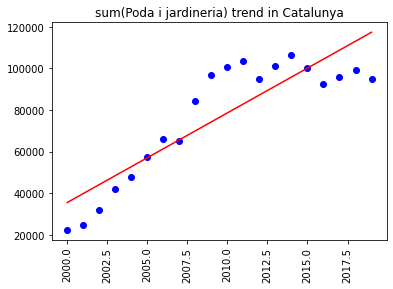

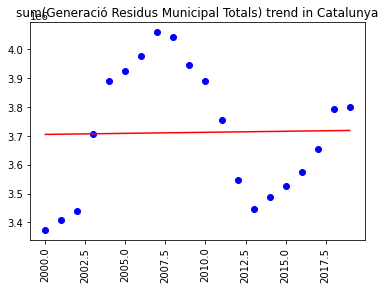

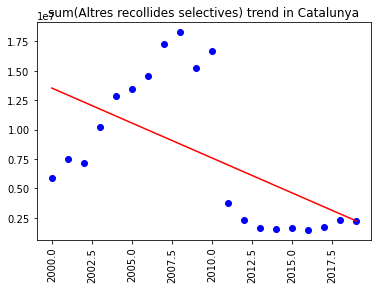

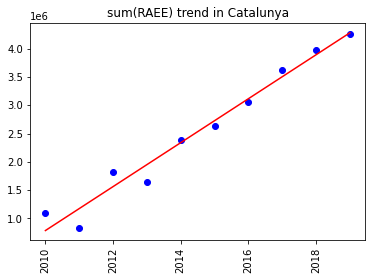

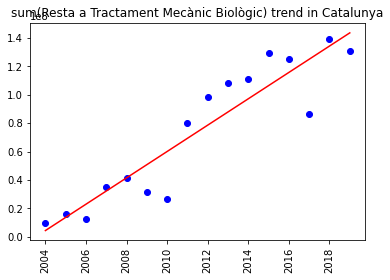

...

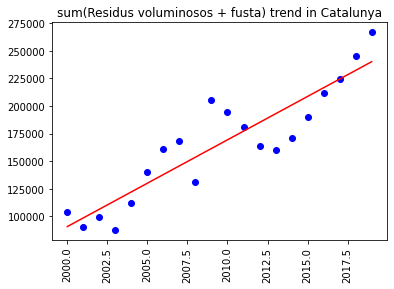

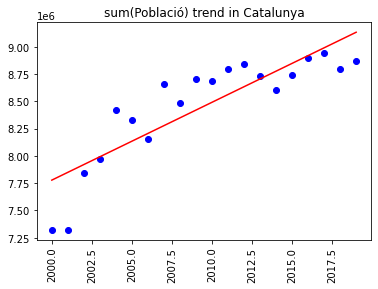

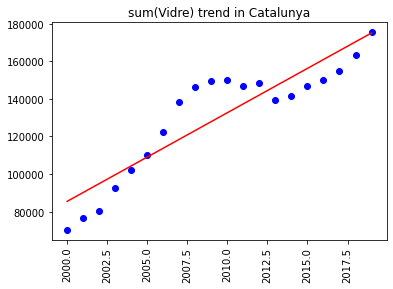

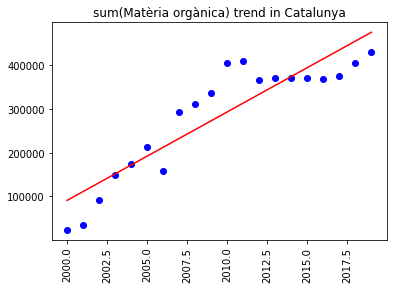

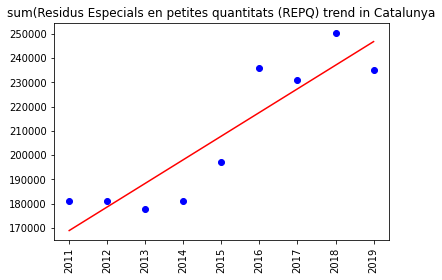

In [47]:
def linear_reg(df, region):
    for col in df.columns:
        if col != 'sum(Any)' and col != 'Any' and col != 'avg(Any)':
            fig, ax = plt.subplots()
            x = col_to_list(df.select("Any").where(f.col(col).isNotNull()), "Any")
            y = col_to_list(df.select(col).where(f.col(col).isNotNull()), col)
            gradient, intercept, r_value, p_value, std_err = stats.linregress(x,y)
            mn=np.min(x)
            mx=np.max(x)
            x1=np.linspace(mn,mx,500)
            y1=gradient*x1+intercept
            ax.plot(x, y, 'ob')
            ax.plot(x1,y1,'-r')
            plt.xticks(rotation=90)
            ax.set_title(col + " trend in "+region)
            plt.show()
linear_reg(cat_tendency, "Catalunya")

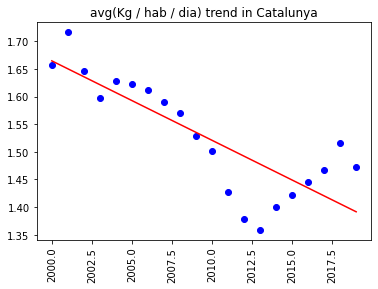

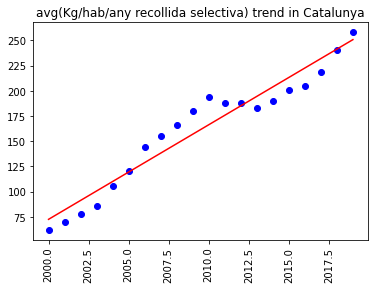

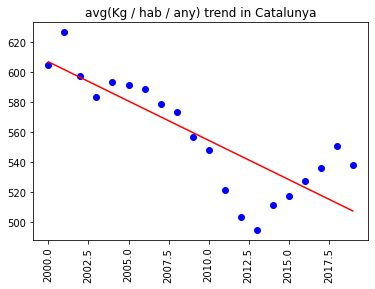

In [48]:
linear_reg(cat_tendency_agrupations, "Catalunya")

## Conclusions on the data

### Generacio residus municipals totals vs Different Waste(Total recollida selectiva)
This is also really good news! While the tendency of the total amount of waste is more or less stable at the same point, it can be seen how the Regular waste(Residus) goes down and all the waste for which is required a selective collecting are going up. This is a clear indicator that people as years pass it's recycling more by classifying the waste instead of throwing it all into the Regular Waste.

This can be seen through all the graphics we have plotted. The most relevant graphics regarding the Regular waste(Residu) are going down, meanwhile all the graphics regarding Selective waste-collecting(Vidre, paper, plastic, Poda i jardineria...) all go up! :)

# Geographic visualization of the more recent waste data (2019)

In this section, the most recent data (2019) is going to be analyzed more in-depth by mixing it with some geographic data. By doing so, we are going to be able to display in maps this information making it more visible and understandable. Data is going to be displayed in two different ways:
- Scatter Plot of Catalonia by the municipality
- Map of Catalonia divided by regions


## Scatter Plot of Catalonia by municipality

This plots will represent for each municipality the amount of waste that they generate. It is going to be ploted for each type of waste.

In [24]:
df_municipis.show(1, vertical=True)

22/06/02 10:41:45 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especials en petites quantitats (REPQ, Piles, Medicaments, Altres recollides selectives, Total Recollida Selectiva, R.S. / R.M. % total, Kg/hab/any recollida selectiva, Resta a Dipòsit, Resta a Incineració, Resta a Tractament Mecànic Biològic, Resta (sense desglossar), Suma Fracció Resta, F.R. / R.M. %, Generació Residus Municipal Totals, Kg / hab / dia, Kg / hab / any
 Schema: _c0, Longitud, Latitud, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especia

-RECORD 0-------------------------------------------------------------
 _c0                                           | 0                    
 Longitud                                      | 1.091706             
 Latitud                                       | 42.161285            
 geometry                                      | POINT (1.09170604... 
 Any                                           | 2000                 
 Codi municipi                                 | 250019.0             
 Municipi                                      | Abella de la Conca   
 Comarca                                       | Pallars Jussà        
 Població                                      | 1860                 
 Autocompostatge                               | null                 
 Matèria orgànica                              | 0.0                  
 Poda i jardineria                             | 0.01                 
 Paper i cartró                                | 6.16                 
 Vidre

Columns not needed and the containing different kind of agrupation are removed

In [25]:
cat_no_agrupations  = df_municipis.drop('_c0','Codi municipi', 'Municipi', 'geometry', 'Comarca', 'F.R. / R.M. %', 'R.S. / R.M. % total', 'Kg / hab / dia', 'Kg / hab / dia', 'Kg/hab/any recollida selectiva', 'Kg / hab / any')

In [26]:
cat_2019 = cat_no_agrupations.filter(cat_no_agrupations.Any == "2019")
cat_2019 = cat_2019.drop("Any")
cat_2019.show(1, vertical=True)

-RECORD 0--------------------------------------------------
 Longitud                                      | 1.091706  
 Latitud                                       | 42.161285 
 Població                                      | 1790      
 Autocompostatge                               | 75.0      
 Matèria orgànica                              | 0.0       
 Poda i jardineria                             | 0.04      
 Paper i cartró                                | 5.16      
 Vidre                                         | 5.71      
 Envasos lleugers                              | 4.32      
 Residus voluminosos + fusta                   | 12.32     
 RAEE                                          | 137.0     
 Ferralla                                      | 9.0       
 Olis vegetals                                 | 3.0       
 Tèxtil                                        | 7.0       
 Runes                                         | 1.0       
 Residus Especials en petites quantitats

In [27]:
cat_2019.describe()

summary,Longitud,Latitud,Població,Autocompostatge,Matèria orgànica,Poda i jardineria,Paper i cartró,Vidre,Envasos lleugers,Residus voluminosos + fusta,RAEE,Ferralla,Olis vegetals,Tèxtil,Runes,Residus Especials en petites quantitats (REPQ,Piles,Medicaments,Altres recollides selectives,Total Recollida Selectiva,Resta a Dipòsit,Resta a Incineració,Resta a Tractament Mecànic Biològic,Resta (sense desglossar),Suma Fracció Resta,Generació Residus Municipal Totals
count,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,0,943,943
mean,1.7492597076255723,41.73533337492958,9406.359490986215,60.48038176033934,455.8148964928228,100.53437567094967,264.2881016017334,186.07783550365352,166.87305478149608,282.943670282889,4512.524920466596,1107.1367974549312,134.12089077412514,1269.3531283138918,11032.414634146342,249.3404029692471,58.349946977730646,81.82078472958642,2363.9925768822905,1629.473882447624,46625.94803817604,16925.734888653235,139041.92258748674,null,2231.2256914341815,4027.3482771923536
stddev,0.7873624200123445,0.42126168124023067,56231.53406099271,165.52849603958828,4050.4581469265427,312.2373059894784,2059.731937583105,1323.4663096747038,911.476833610611,1509.3004877036276,26769.30427053767,3412.252994156295,767.0947855371954,6305.696955861382,32728.62075452466,760.295665285875,360.4549886613395,641.7672147040724,12807.450013576597,10414.422005097775,257380.96046990395,192457.70767426616,1427360.3312288076,null,16752.336692448836,27256.23918156957
min,0.25057194,40.542862,1000,0.0,0.0,0.0,0.15,0.94,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.086,0.0,0.0,0.0,null,1.063,1.924
max,3.275849,42.838367,9980,2673.0,121988.05,4314.48,60624.75,39139.9,25792.81,41723.89,752192.0,50633.0,19571.0,121145.0,542379.0,13378.0,10019.0,18581.0,251799.0,307418.22,5625846.0,4353751.0,4.18539E7,null,484200.2,791618.44


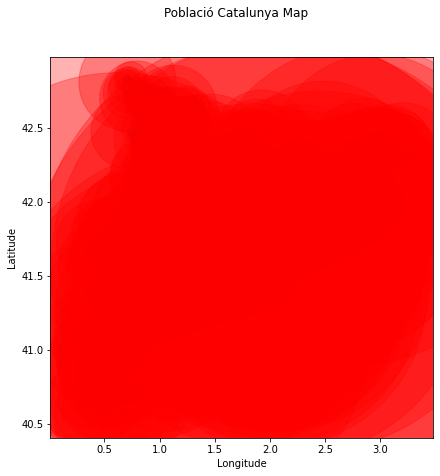

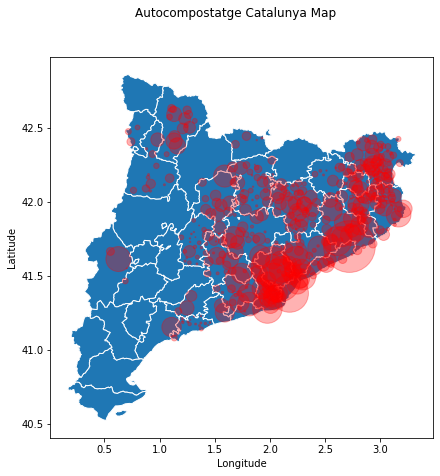

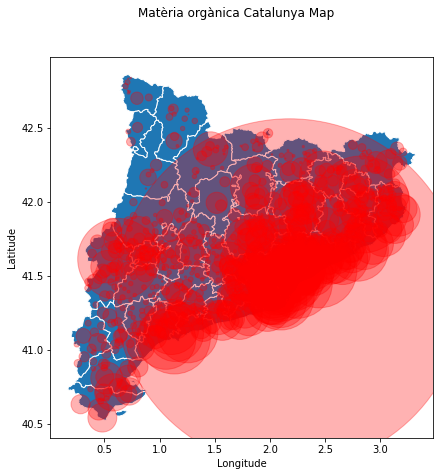

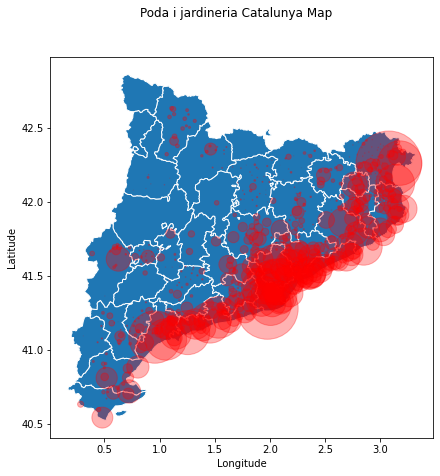

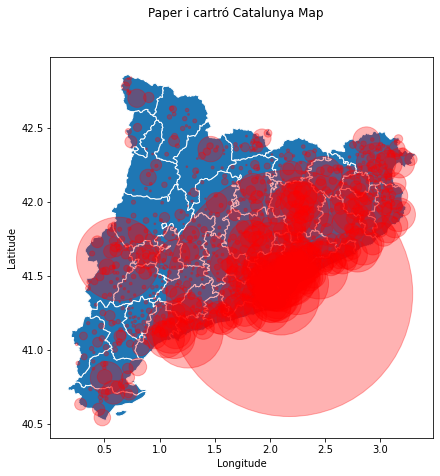

...

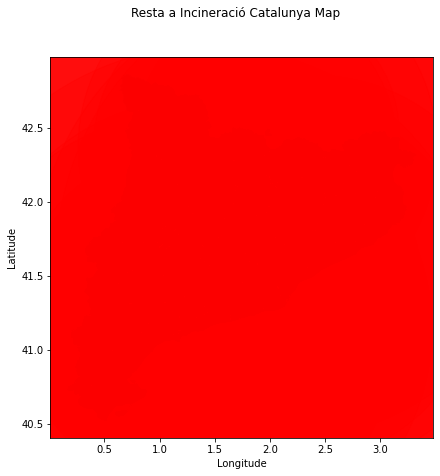

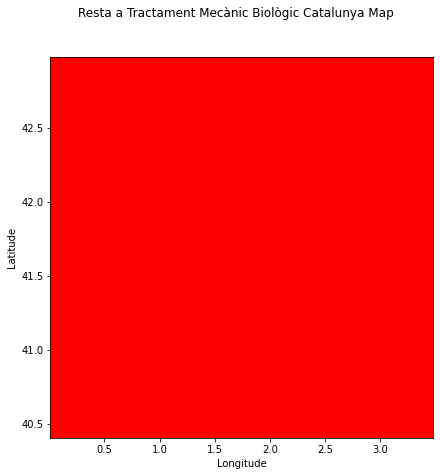

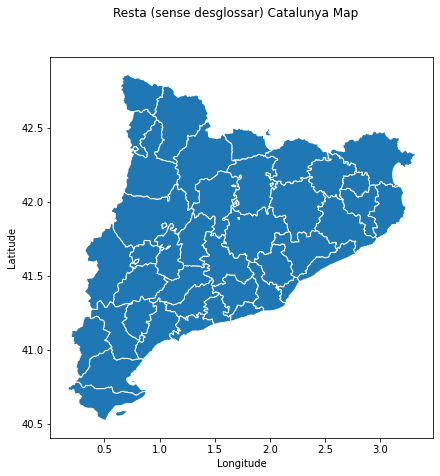

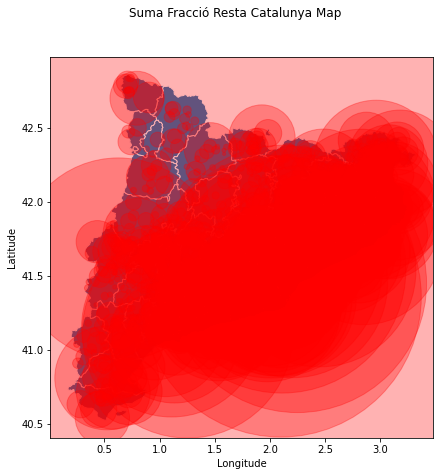

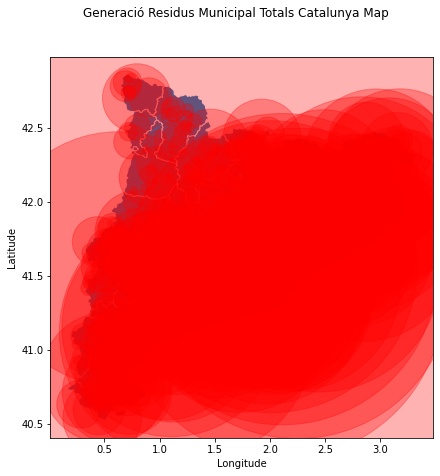

In [28]:
def plot_municipal_scatter_by_waste(df_year, transf):
    df_year = df_year.fillna(0)
    for col in df_year.columns:
        if col not in ['Latitud', 'Longitud']:
            subdf_year = df_year.select(f.col('Latitud'), f.col('Longitud'), f.col(col))
            fig, ax = plt.subplots(figsize=(7,7))
            comarques.plot(ax=ax, edgecolor="white")
            plt.autoscale()
            try:
                plt.scatter(list(map(lambda x : x, col_to_list(subdf_year, 'Longitud'))), list(map(lambda x : x, col_to_list(subdf_year, 'Latitud'))), s=list(map(lambda x : transf(float(x)), col_to_list(subdf_year, col))), color="red", alpha=0.3)
            except:
                pass
            fig.suptitle(col+' Catalunya Map', fontsize=12)
            ax.set_xlabel('Longitude', fontsize=10)
            ax.set_ylabel('Latitude', fontsize='medium')
            plt.show()
plot_municipal_scatter_by_waste(cat_2019, lambda x : x)

Due to that, some graphics are not clear enough about the fact that there are plots with enormous values(Specifically the municipalities where there are more citizens). A transformation of the data has been applied to make this data follow a specific function shape. The Transformation that has been applied in this case is the Squared root of all the values so that those values follow the shape of this function. By doing it we accomplish reduced values that persist in the integrity of the data.

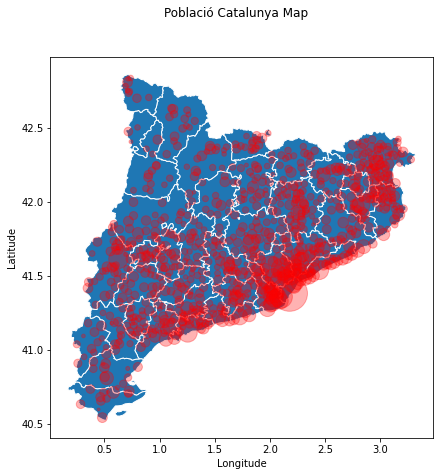

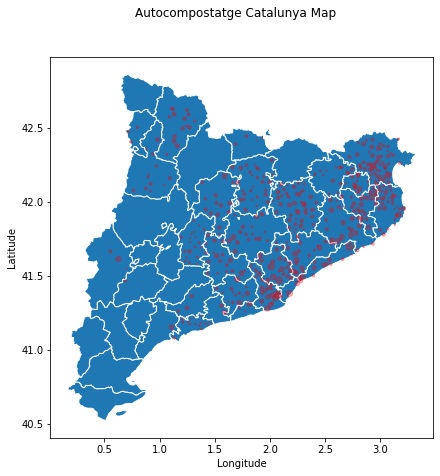

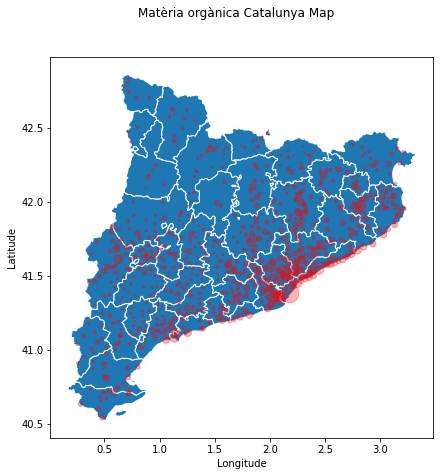

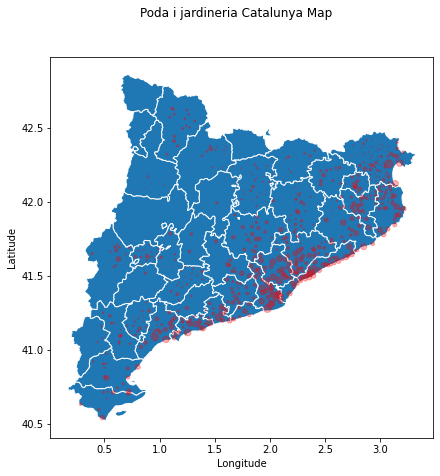

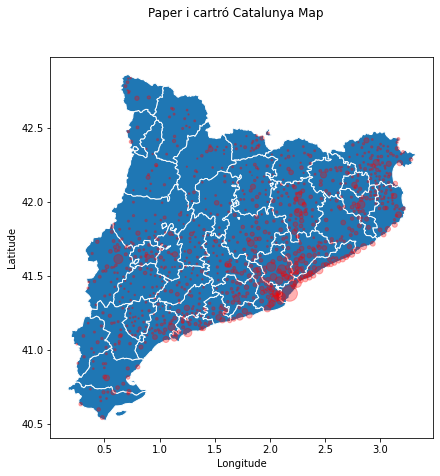

...

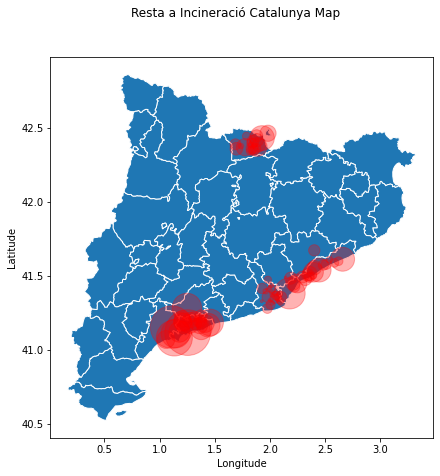

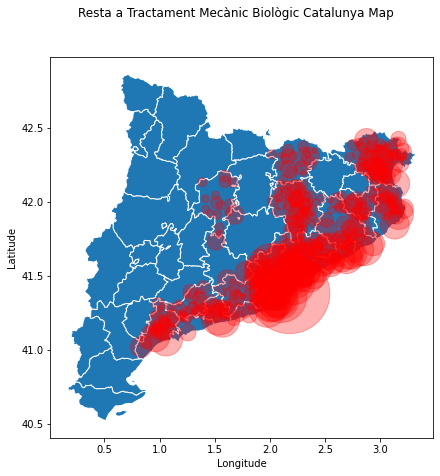

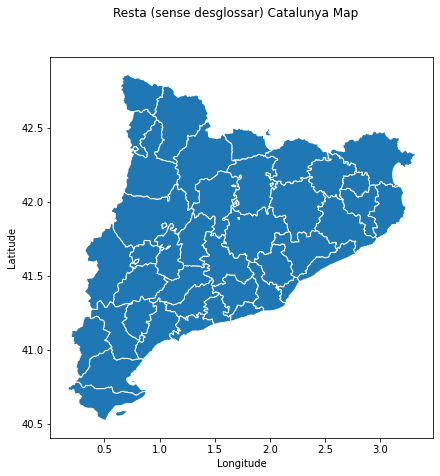

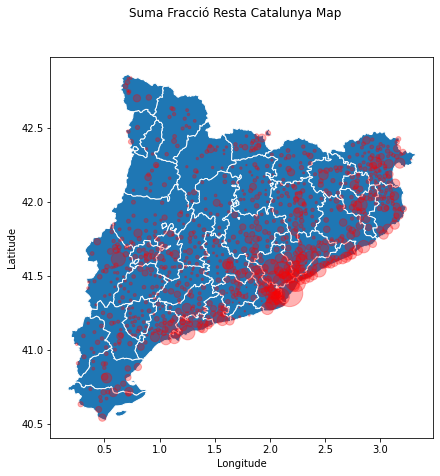

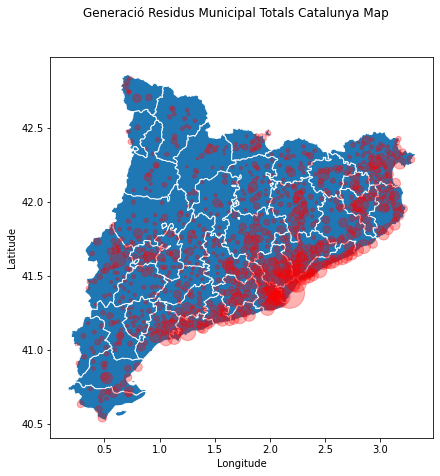

In [29]:
plot_municipal_scatter_by_waste(cat_2019, lambda x : math.sqrt(x))

## Conclusions on the data

### Big cities generate more waste
This is a bit logic :)

### Textile Industry-focused in Valles-Barcelona-Maresme Regions.
As it is well known and this graphics show as well. Almost all of the Textile industry is concentrated in the regions of Valles-Barcelona-Maresme. This is due to historical reasons, as the first big local textile enterprises sat there since the beginning of the textile industry in Catalonia.

### Runes waste mostly on the coast
Another relevant fact that we can extract from this plot is that almost all the waste regarding runes is concentrated on the seaside of Catalunya. Also, it can be seen how the values are also high for some heavily touristic parts of Catalonia like the Pyrenees and Delta de l'Ebre.

### Girona and Barcelona Composting
This was impressive. The region of Girona together with BCN and Central Catalonia are the ones with more composting waste. This can be also related because is one of the regions of Catalonia with more farms and a meat industry. A surprising thing is that Lleida has nothing to deal with Composting while is one of the biggest exporters zones of fruit in Spain.

### Materia Organica Costa
As it can be seen, there is a big concentration of organic waste in places near the coast. This is for sure related to the Tourism and hostelry sector where it's a lot more present. 

### Lleida not recicling very well
As can be seen in the graphics, seems that the Lleida region, in particular, is generating a lot of Regular waste but not that much selective waste. This is indicative that Lleida Region in particular is not doing that good in the recycling task. Recently the government of Catalunya started with the initiative of "Porta a porta" in a lot of municipalities in that region to have better control over how people manage waste. 

### Incineration Regular waste.
It can be seen how this graphic shows the principal 3 regions of Catalunya with the chemical industry. To remark the place where the Petroquimica of Tarragona is situated. Those chemical companies try to get fuel from those waste.

### Paper, Glass, and Plastic 
It can be seen how more or less follow a similar shape for all regions in the three cases

### RAEE in metropolitan places
As it can be seen Electrical waste is more significant in that places where there are more citizens. In the rural zones is not that relevant.

## Map of catalonia divided by regions

In this case, we are going to group the data of the municipalities by the region in which they are located. Then, some graphics representing these regions will be plotted in function of the amount of waste generated in each. Those plots are also going to be separated by the type of waste.

As this is a different dataset we start by creating the schema for this one.

In [30]:
schema_region = StructType([ 
    StructField("_c0",IntegerType(),True), 
    StructField("geometry", StringType(), True), 
    StructField("Any", IntegerType(), True), 
    StructField("Codi municipi", StringType(), True), 
    StructField("Municipi", StringType(), True), 
    StructField("Comarca", StringType(), True), 
    StructField("Població", StringType(), True), 
    StructField("Autocompostatge",FloatType(),True), 
    StructField("Matèria orgànica",FloatType(),True), 
    StructField("Poda i jardineria",FloatType(),True), 
    StructField("Paper i cartró",FloatType(),True), 
    StructField("Vidre",FloatType(),True), 
    StructField("Envasos lleugers",FloatType(),True), 
    StructField("Residus voluminosos + fusta",FloatType(),True), 
    StructField("RAEE",FloatType(),True), 
    StructField("Ferralla",FloatType(),True), 
    StructField("Olis vegetals",FloatType(),True), 
    StructField("Tèxtil",FloatType(),True), 
    StructField("Runes",FloatType(),True), 
    StructField("Residus Especials en petites quantitats (REPQ",FloatType(),True), 
    StructField("Piles",FloatType(),True), 
    StructField("Medicaments",FloatType(),True), 
    StructField("Altres recollides selectives",FloatType(),True), 
    StructField("Total Recollida Selectiva",FloatType(),True), 
    StructField("R.S. / R.M. % total",FloatType(),True), 
    StructField("Kg/hab/any recollida selectiva",FloatType(),True), 
    StructField("Resta a Dipòsit",FloatType(),True), 
    StructField("Resta a Incineració",FloatType(),True), 
    StructField("Resta a Tractament Mecànic Biològic",FloatType(),True), 
    StructField("Resta (sense desglossar)",FloatType(),True), 
    StructField("Suma Fracció Resta",FloatType(),True), 
    StructField("F.R. / R.M. %",FloatType(),True),
    StructField("Generació Residus Municipal Totals",FloatType(),True),
    StructField("Kg / hab / dia",FloatType(),True),
    StructField("Kg / hab / any",FloatType(),True)
  ])

In [31]:
waste_file_region = "./datasets/enriched/residus_comarca_geo.csv"
df_comarques = spark.read.schema(schema_region).csv(waste_file_region, header=True)
df_comarques = df_comarques.withColumn("Població", remove_dots_and_cast(f.col("Població")))
df_comarques = df_comarques.withColumn("Població", df_comarques["Població"].cast(IntegerType()))
df_comarques.show(1, vertical=True)

-RECORD 0-------------------------------------------------------------
 _c0                                           | 0                    
 geometry                                      | POLYGON ((1.47500... 
 Any                                           | 2000                 
 Codi municipi                                 | 430017.0             
 Municipi                                      | Aiguamúrcia          
 Comarca                                       | Alt Camp             
 Població                                      | 6140                 
 Autocompostatge                               | null                 
 Matèria orgànica                              | 0.0                  
 Poda i jardineria                             | 0.0                  
 Paper i cartró                                | 12.51                
 Vidre                                         | 37.0                 
 Envasos lleugers                              | 3.83                 
 Resid

22/06/02 10:42:12 WARN CSVHeaderChecker: CSV header does not conform to the schema.
 Header: , geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especials en petites quantitats (REPQ, Piles, Medicaments, Altres recollides selectives, Total Recollida Selectiva, R.S. / R.M. % total, Kg/hab/any recollida selectiva, Resta a Dipòsit, Resta a Incineració, Resta a Tractament Mecànic Biològic, Resta (sense desglossar), Suma Fracció Resta, F.R. / R.M. %, Generació Residus Municipal Totals, Kg / hab / dia, Kg / hab / any
 Schema: _c0, geometry, Any, Codi municipi, Municipi, Comarca, Població, Autocompostatge, Matèria orgànica, Poda i jardineria, Paper i cartró, Vidre, Envasos lleugers, Residus voluminosos + fusta, RAEE, Ferralla, Olis vegetals, Tèxtil, Runes, Residus Especials en petites quantitats (REPQ, Piles,

In [32]:
comarques_no_agrupations  = df_comarques.drop('_c0','Codi municipi', 'Latitud', 'Longitud', 'Municipi', 'F.R. / R.M. %', 'R.S. / R.M. % total', 'Kg / hab / dia', 'Kg / hab / dia', 'Kg/hab/any recollida selectiva', 'Kg / hab / any')

In [33]:
comarques_no_agrupations.show(1, vertical=True)

-RECORD 0-------------------------------------------------------------
 geometry                                      | POLYGON ((1.47500... 
 Any                                           | 2000                 
 Comarca                                       | Alt Camp             
 Població                                      | 6140                 
 Autocompostatge                               | null                 
 Matèria orgànica                              | 0.0                  
 Poda i jardineria                             | 0.0                  
 Paper i cartró                                | 12.51                
 Vidre                                         | 37.0                 
 Envasos lleugers                              | 3.83                 
 Residus voluminosos + fusta                   | 0.0                  
 RAEE                                          | null                 
 Ferralla                                      | null                 
 Olis 

In [34]:
comarques_no_agrupations = comarques_no_agrupations.fillna(0)
comarques_no_agrupations.show(1, vertical=True)

-RECORD 0-------------------------------------------------------------
 geometry                                      | POLYGON ((1.47500... 
 Any                                           | 2000                 
 Comarca                                       | Alt Camp             
 Població                                      | 6140                 
 Autocompostatge                               | 0.0                  
 Matèria orgànica                              | 0.0                  
 Poda i jardineria                             | 0.0                  
 Paper i cartró                                | 12.51                
 Vidre                                         | 37.0                 
 Envasos lleugers                              | 3.83                 
 Residus voluminosos + fusta                   | 0.0                  
 RAEE                                          | 0.0                  
 Ferralla                                      | 0.0                  
 Olis 

In [35]:
comarques_no_agrupations = comarques_no_agrupations.select("*").where(f.col("Any") == 2019)
comarques_no_agrupations.show(1, vertical=True)

-RECORD 0-------------------------------------------------------------
 geometry                                      | POLYGON ((1.47500... 
 Any                                           | 2019                 
 Comarca                                       | Alt Camp             
 Població                                      | 9010                 
 Autocompostatge                               | 0.0                  
 Matèria orgànica                              | 38.0                 
 Poda i jardineria                             | 0.0                  
 Paper i cartró                                | 17.47                
 Vidre                                         | 38.82                
 Envasos lleugers                              | 21.37                
 Residus voluminosos + fusta                   | 45.72                
 RAEE                                          | 357.0                
 Ferralla                                      | 0.0                  
 Olis 

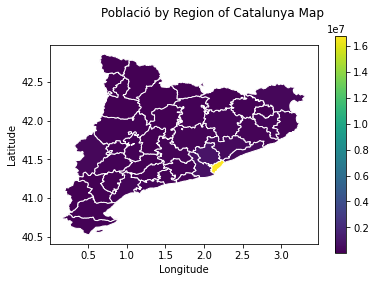

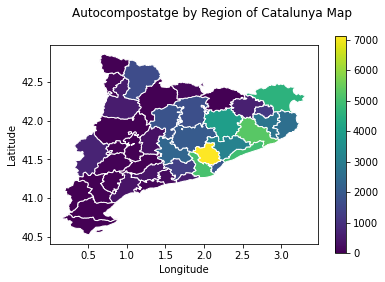

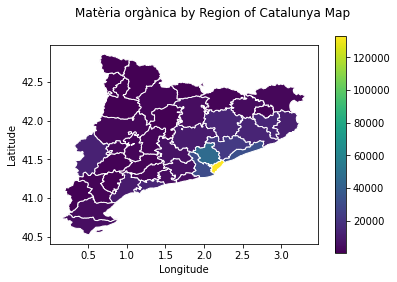

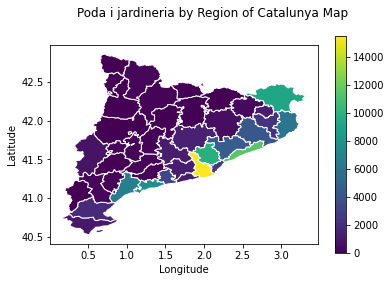

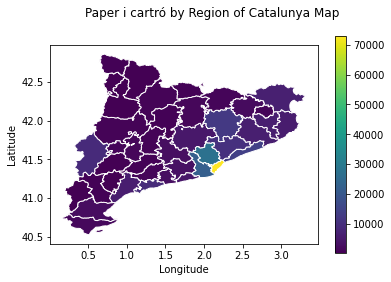

...

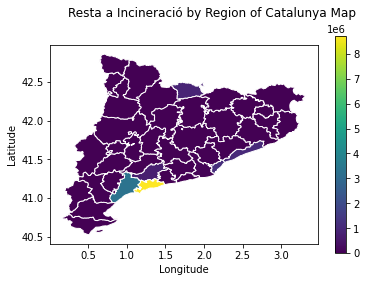

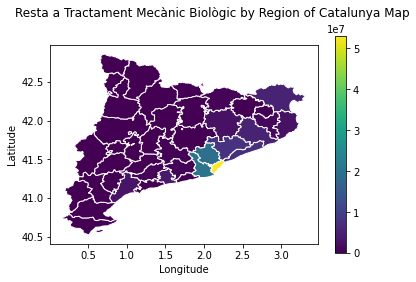

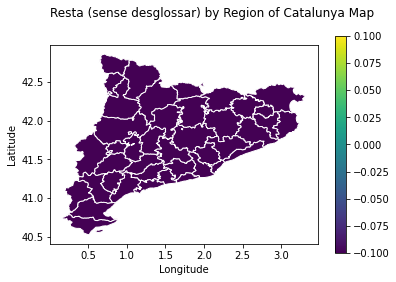

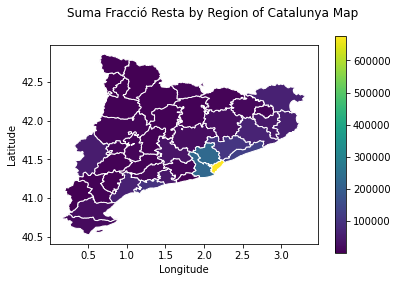

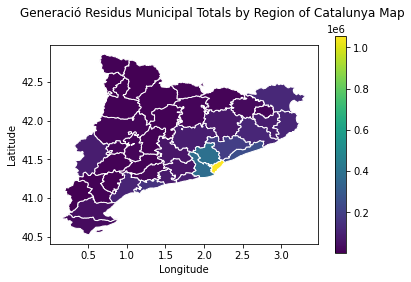

In [36]:
def plot_regions_by_waste(df_year, transf):
    gruped_region = df_year.toPandas()
    gruped_region['geometry'] = gruped_region['geometry'].apply(wkt.loads)
    gdf_year = geopandas.GeoDataFrame(gruped_region, geometry='geometry')
    for col in gdf_year.columns:
        if col not in ['geometry', 'Any', 'Comarca', 'sum(Any)']:
            geo_value = gdf_year.drop(columns=gdf_year.columns.difference(['geometry','Comarca', col])).dissolve(by='Comarca', aggfunc='sum')
            geo_value[col] = geo_value[col].apply(lambda x : transf(x) if x != 0 else x )
            fig, ax = plt.subplots()
            geo_value.plot(ax=ax, column=col, edgecolor="white", legend=True)
            fig.suptitle(col+' by Region of Catalunya Map', fontsize=12)
            ax.set_xlabel('Longitude', fontsize=10)
            ax.set_ylabel('Latitude', fontsize='medium')
            plt.show()
plot_regions_by_waste(comarques_no_agrupations, lambda x : x)

Similarly to before, we see how Barcelona has a lot of importance and does not let us study properly the rest of the territory as it is a big outlier. For this reason, also a transformation of the data has been applied. This time it has been decided to apply a logarithmic transformation so that we annulate the outlier of Barcelona and we can focus on analyzing other regions of the territory.

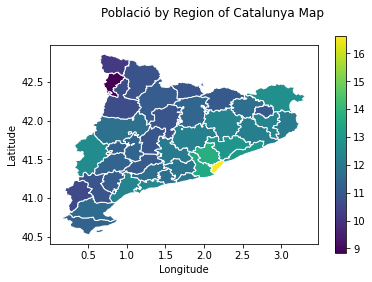

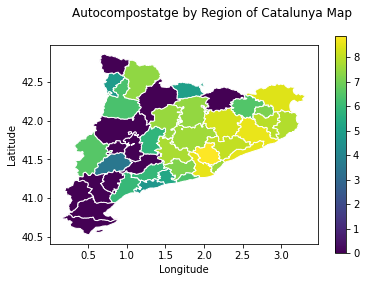

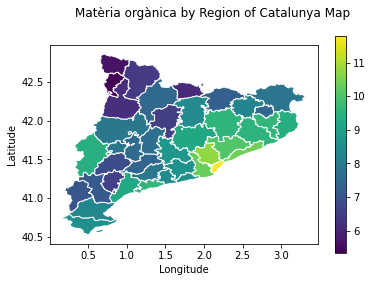

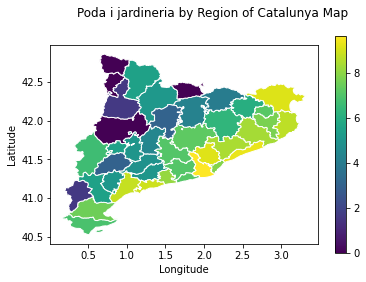

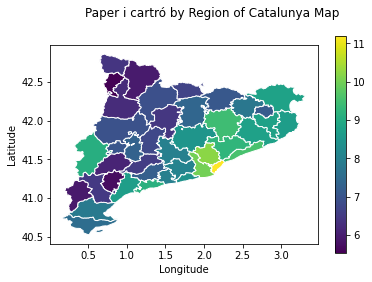

...

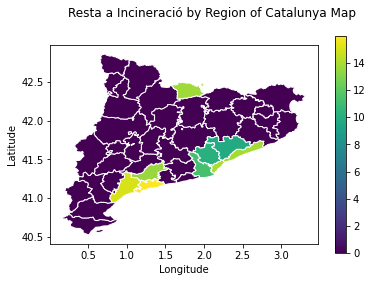

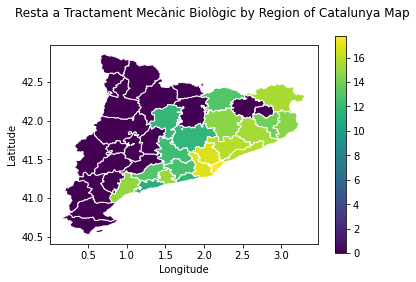

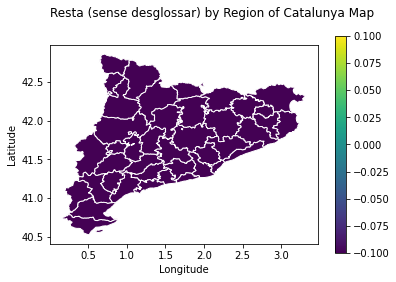

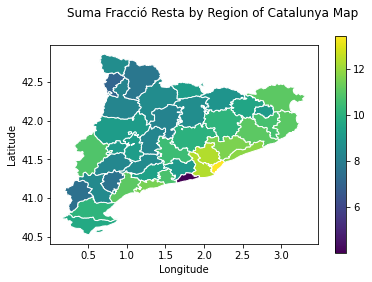

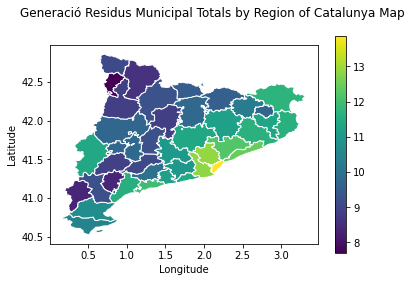

In [37]:
plot_regions_by_waste(comarques_no_agrupations, lambda x : math.log(x))

We though that a good insight would be to see the regions in wich more waste is generated by citezen.

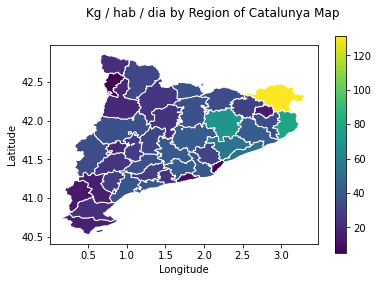

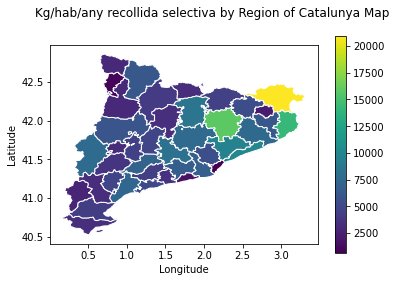

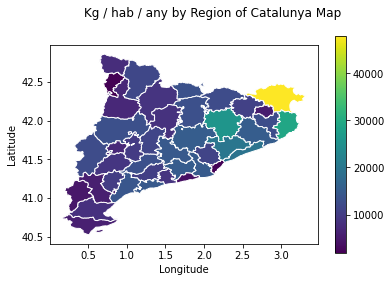

In [62]:
region_agrupations = df_comarques.select('Any', 'Comarca', 'geometry', 'Kg / hab / dia', 'Kg/hab/any recollida selectiva', 'Kg / hab / any')
region_agrupations = region_agrupations.select("*").where(f.col("Any") == 2019).sort('Any').fillna(0)
plot_regions_by_waste(region_agrupations, lambda x : x)

## Data observations

### Barcelona less Kg / citezen
Barcelona is by far the city that generate more waste, but it's citezens are the ones that generate ress waste over all the territory.This is for sure something related with the space!

### Alt Emporda Kg/citezens
A think to remark is that Alt emporda is the region where it's citezense generate more waste. They generate a median of more than **120 kg / day / hab** and more than **40.000 kg / year / hab**. This is pretty impressing, Wow! 

Having a look at the graphics, the most relevant amounts of waste that are generated are due to "Runes", "Ferralla", "Poda i Jardineria", "Materia Organica" and "Autocompostatge". We predict that those kind of waste are generated mostly because Alt Emporda is a region with High life standards as well as good Farmer and Agricultural Industry.

### Confirmation Lleida is not good at recycling
We can see how Lleida is one of the regions that generate more waste and almost all of this waste is Regular waste!!

### Regular Waste to Incinarate in Tarragona
We can see how Tarragona is by far the place that Incinerates most of the Regular waste that is generated there. That is becoause of the famous Petroquimica de Tarragona. There, they try to gather fuel from those waste.

### A bit of textile waste in Segrià
It can be seen how a bit of Textile waste is done in Segrià region. This is due to that near Segre river there are some textile industries! :)

### Pla d'urgell metal scrap
It has been observed that in Pla d'Urgell there is a lot of Metal Scarp waste. After some time of researching why it was not found any reason. It is well known that Mollerusa has a powerful industrial zone, so it could be related to this.

### Confirmation Runes in touristic places
We can also see how runes are a lot more concentrated in touristic places like the seaside.

### "Poda i jardineria" in more urbanized places
It can be seen how almost all the Poda i jardineria waste is collected from the most urbanized places. This in a first instance is surprising because for example here in lleida there is a lot of Agriculture. But it's logical that it's difficult to manage this kind of waste on urbanized places than here in Lleida. As agriculture waste regarding poda and jardineria is almost all burn.

# Study of waste in Segrià Region

As it has been seen in the previous plots, the region of Segrià seems not to be recycling good. Lets use the previous functions developed for checking the progression of catalunya just for the region of Segrià to see its evolution in particular.

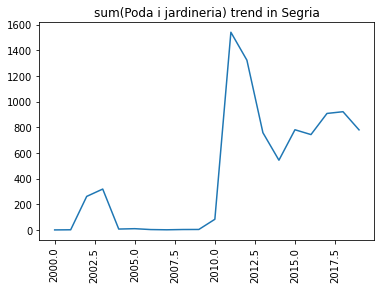

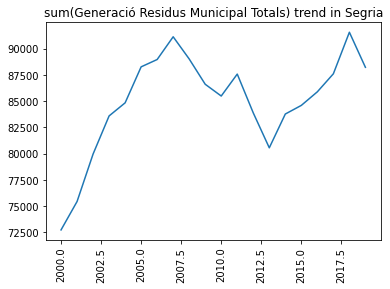

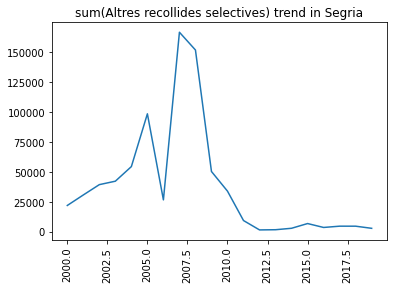

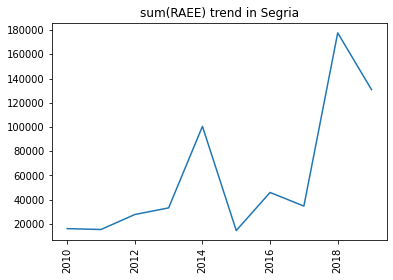

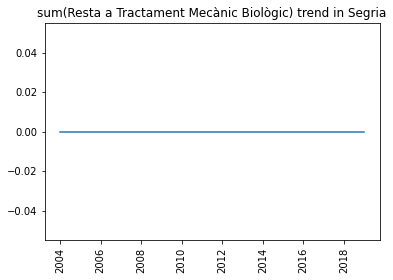

...

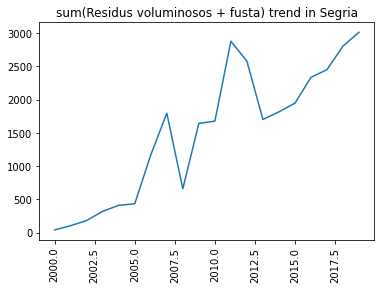

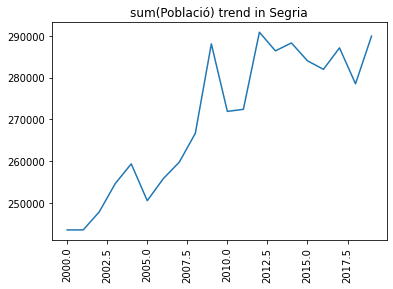

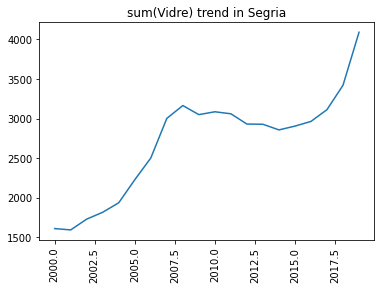

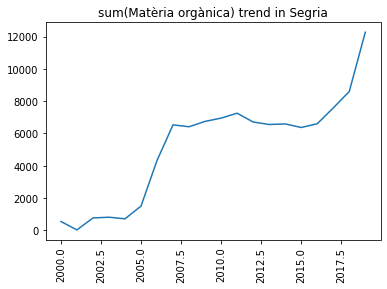

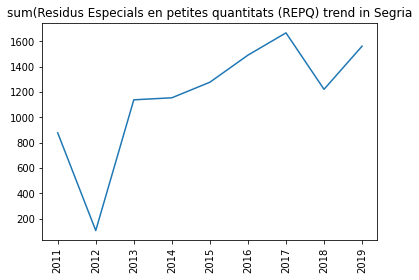

In [49]:
segria_trend  = df_municipis.select("*").where(f.col("Comarca") == "Segrià").drop('_c0', 'Latitud', 'Longitud','geometry','Codi municipi', 'Municipi', 'Comarca', 'F.R. / R.M. %', 'R.S. / R.M. % total', 'Kg / hab / dia', 'Kg / hab / dia', 'Kg/hab/any recollida selectiva', 'Kg / hab / any')
sumcols = { x : "sum" for x in segria_trend.columns}
segria_trend = segria_trend.groupBy("Any").agg(sumcols).sort("Any")
lineplot_waste_by_year(segria_trend, "Segria")

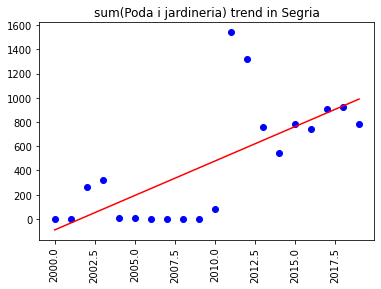

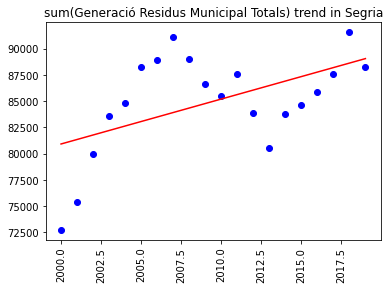

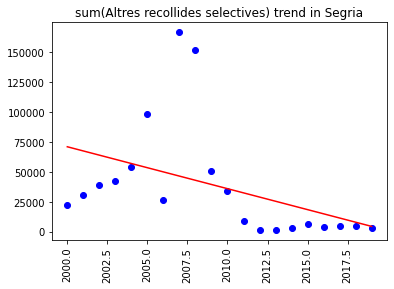

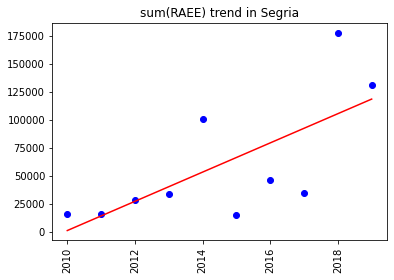

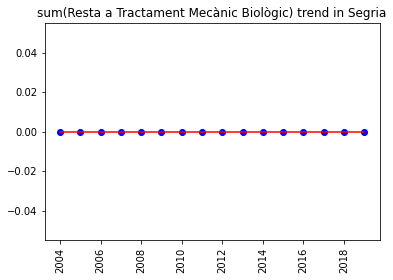

...

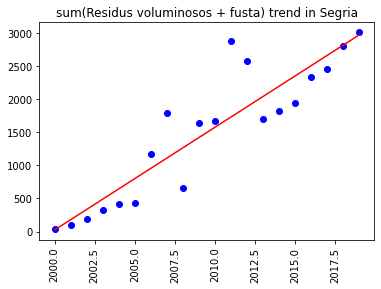

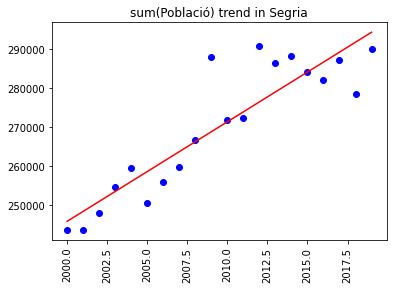

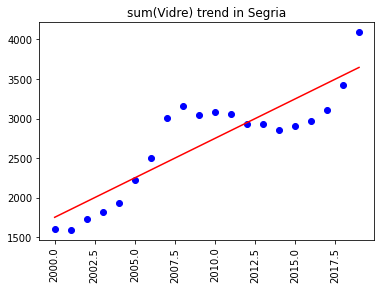

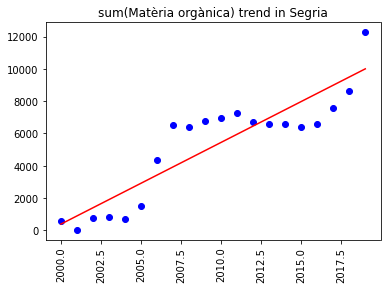

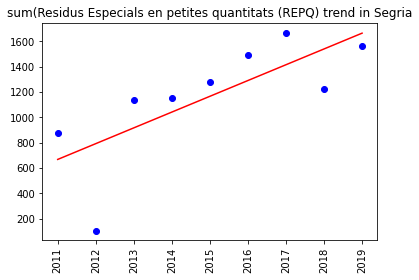

In [50]:
linear_reg(segria_trend, "Segria")

## Data observations

All the Normal waste in this region is sent to storage, this maybe explains why we can see a strong yellow color in the plot that represents "Resta a Diposit" waste in the region's plot. Nevertheless, even the indicators of the trend and the regressions are favorable in terms of selective collection, in Lleida still a lot of Regular waste is generated. As a matter of fact, the numbers are more or less equal with Tarragona, and Tarragona has double the population.

# Plot per waste of map subplots per year

Could be interesting to plot all the maps year by year to see the evolution. For doing so we will save all the plots in the file system organized by folders so that we can see the evolution of each waste separately. 

**Not needed to execute these ones, all figures are inside the folders**

In [ ]:
def save_municipal_scatter_by_waste(df_year, transf, year):
    df_year = df_year.fillna(0)
    for col in df_year.columns:
        plt.ioff()
        if not os.path.isdir(os.path.join("./scatters", col)):  
            os.mkdir(os.path.join("./scatters", col))
        if col not in ['Latitud', 'Longitud']:
            subdf_year = df_year.select(f.col('Latitud'), f.col('Longitud'), f.col(col))
            fig, ax = plt.subplots(figsize=(7,7))
            comarques.plot(ax=ax, edgecolor="white")
            plt.autoscale()
            try:
                plt.scatter(list(map(lambda x : x, col_to_list(subdf_year, 'Longitud'))), list(map(lambda x : x, col_to_list(subdf_year, 'Latitud'))), s=list(map(lambda x : transf(float(x)), col_to_list(subdf_year, col))), color="red", alpha=0.3)
            except:
                pass
            fig.suptitle(col+' Catalunya Map', fontsize=12)
            ax.set_xlabel('Longitude', fontsize=10)
            ax.set_ylabel('Latitude', fontsize='medium')
            plt.savefig("./scatters/"+col+"/"+str(year)+".png")

for year in sorted(col_to_list(cat_no_agrupations.select('Any').distinct(), "Any")):
    print("Year "+str(year)+"-----------------------------------------------------------------------")
    year_df = cat_no_agrupations.filter(cat_no_agrupations.Any == year)
    year_df = year_df.fillna(0)
    year_df.drop("Any")
    save_municipal_scatter_by_waste(year_df, lambda x : math.sqrt(x), year)

In [ ]:
def save_regions_by_waste(df_year, transf, year):
    gruped_region = df_year.toPandas()
    gruped_region['geometry'] = gruped_region['geometry'].apply(wkt.loads)
    gdf_year = geopandas.GeoDataFrame(gruped_region, geometry='geometry')
    for col in gdf_year.columns:
        plt.ioff()
        if not os.path.isdir(os.path.join("./regions", col)):  
            os.mkdir(os.path.join("./regions", col))
        if col not in ['geometry', 'Any', 'Comarca', 'sum(Any)']:
            geo_value = gdf_year.drop(columns=gdf_year.columns.difference(['geometry','Comarca', col])).dissolve(by='Comarca', aggfunc='sum')
            geo_value[col] = geo_value[col].apply(lambda x : transf(x) if x != 0 else x )
            fig, ax = plt.subplots()
            geo_value.plot(ax=ax, column=col, edgecolor="white", legend=True)
            fig.suptitle(col+' by Region of Catalunya Map', fontsize=12)
            ax.set_xlabel('Longitude', fontsize=10)
            ax.set_ylabel('Latitude', fontsize='medium')
            plt.savefig("./regions/"+col+"/"+str(year)+".png")

comarques_no_agrupations  = df_comarques.drop('_c0','Codi municipi', 'Latitud', 'Longitud', 'Municipi', 'F.R. / R.M. %', 'R.S. / R.M. % total', 'Kg / hab / dia', 'Kg / hab / dia', 'Kg/hab/any recollida selectiva', 'Kg / hab / any')
comarques_no_agrupations = comarques_no_agrupations.fillna(0)
for year in sorted( col_to_list(cat_no_agrupations.select('Any').distinct(), "Any")):
    print("Year "+str(year)+"-----------------------------------------------------------------------")
    year_df = comarques_no_agrupations.filter(comarques_no_agrupations.Any == year)
    year_df = year_df.fillna(0)
    year_df.drop("Any")
    save_regions_by_waste(year_df, lambda x : math.log(x), year)

## Data Observations

All this data can be found in folders scatters and regions.

### Poblacio
By doing a comparison of the distribution of the population by regions between 2000 and 2019. We saw exactly the opposite that we were seeking to see. Instead of seeing a depopulation of rural and inside regions, we see a repopulation effect which has amazed us.

### RAEE 
RAEE had the opposite effect. In 2010 the waste of RAEE was almost generalized in all Catalonia but as the years passed, it can be seen how has been moving to more urbanized places.

## Embasos lleugers i Paper i cartro
Same as RAEE, at 2000s there was generated I more places. Now it is more focused on big cities.